In [1]:
from matplotlib import pyplot as plt
import numpy as np
import jax.numpy as jnp
from pyslime import slime
from pyslime import utils as pu
from pyslime.pipeline import pipelineUtils as ppu
import glob
import pandas as pd
import pickle
import cmasher

from astropy.table import Table, vstack
from astropy.cosmology import Planck15 as cosmo
from astropy.coordinates import SkyCoord
import astropy.units as u

%matplotlib inline
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 16


# All the data live here (except the simulation binaries):
datadir = "/Volumes/GoogleDrive-101511024793685627081/My Drive/SlimeMold/2021-11-23-VACv2/"
dropboxdir = "/Users/mwilde/Dropbox/slime-mold/data/final_data/"
packagedir = "/Users/mwilde/python/pyslime/pyslime/pipeline/data/"
otherdatadir = "/Users/mwilde/python/pyslime/pyslime/data/"

### STEP 1: Compute the mapping from the BP simulation to the SlimeMold
# DM denstiy from the simulations
bpDensityFile_z0p0 = dropboxdir + "BP_0214_densities_1024_0.bin"
bpDensityFile_z0p5 = dropboxdir + "BP_0170_densities_1024_0.bin"

# slime fit to the BP simulations
bpslimedir = datadir + "BP_z=0.0"
bpslime_datafile = "trace.bin"

In [2]:
slimeobj = slime.Slime.from_dir(bpslimedir)
slimedata = np.log10(slimeobj.data[0:5, :, :] + 1)

bpslimedir_z5 = datadir + "BP_z=0.5"
slimeobj_zp5 = slime.Slime.from_dir(bpslimedir_z5)
slimedata_zp5 = np.log10(slimeobj_zp5.data[0:5, :, :] + 1)

In [3]:
bprho_z0 = ppu.get_sim_data('/Users/mwilde/Dropbox/slime-mold/data/final_data/BP_0214_densities_1024_0.bin')
bprho_z5 = ppu.get_sim_data('/Users/mwilde/Dropbox/slime-mold/data/final_data/BP_0170_densities_1024_0.bin')

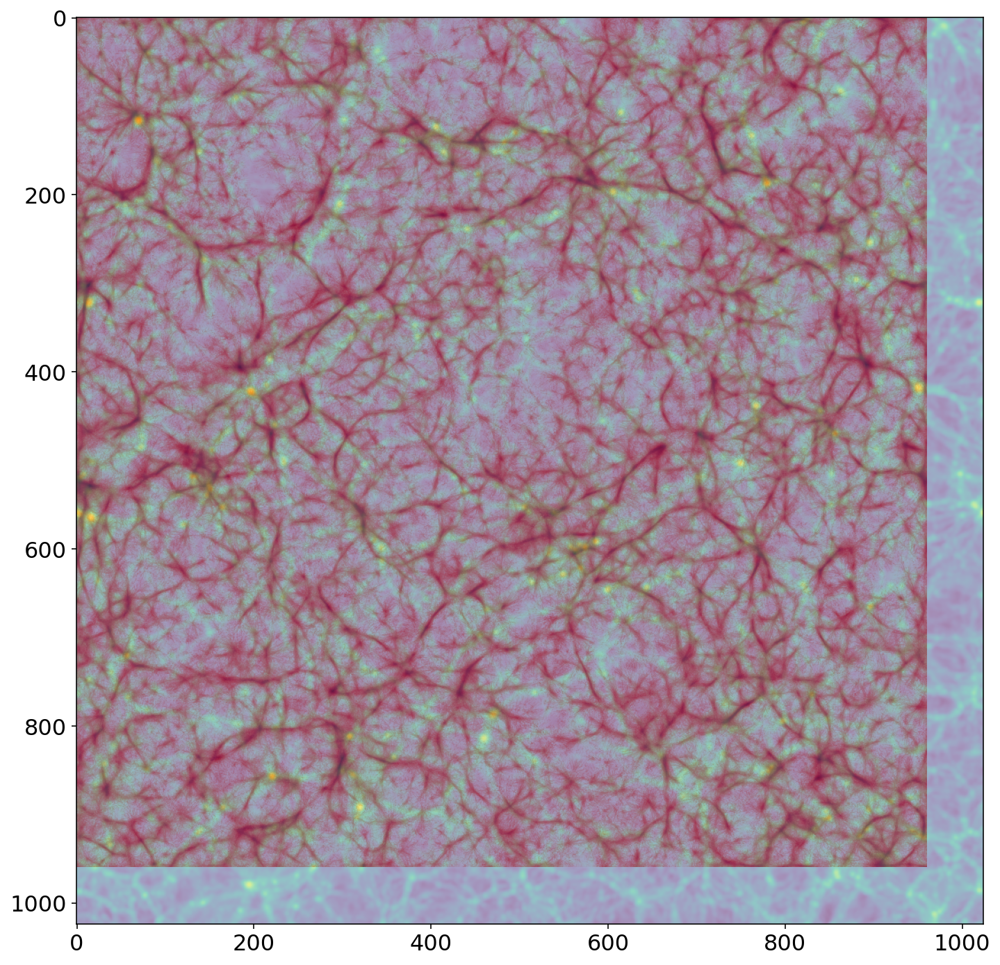

In [4]:
plt.figure(figsize=(12,12))
plt.imshow(np.sum(slimedata_zp5, axis=0), cmap='Reds')
plt.imshow(np.sum(bprho_z5[0:5,:,:], axis=0), alpha=0.5);



In [5]:
"""bpslime_z0 = pu.get_slime(
    bpslimedir, dtype=np.float32, standardize=False
)

bpslimedir_z5 = datadir + "BP_z=0.5"
bpslime_z5 = pu.get_slime(
    bpslimedir_z5, dtype=np.float32, standardize=False
)"""

'bpslime_z0 = pu.get_slime(\n    bpslimedir, dtype=np.float32, standardize=False\n)\n\nbpslimedir_z5 = datadir + "BP_z=0.5"\nbpslime_z5 = pu.get_slime(\n    bpslimedir_z5, dtype=np.float32, standardize=False\n)'

In [6]:
slimeobj = slime.Slime.from_dir(bpslimedir)
slimedata = np.log10(slimeobj.data[0:5, :, :] + 1)

bpslimedir_z5 = datadir + "BP_z=0.5"
slimeobj_zp5 = slime.Slime.from_dir(bpslimedir_z5)
slimedata_zp5 = np.log10(slimeobj_zp5.data[0:5, :, :] + 1)

In [7]:
if False:
    pfitFile = '/Users/mwilde/python/pyslime/pyslime/pipeline/data/mapping_BP_z0p0_pfit.npz'
    npzfile = np.load(pfitFile)
    z = npzfile['arr_0']
    pfit = np.poly1d(z)
    from pyslime.pipeline import interpolate, catalogs

    xfull = np.linspace(-0.5, 4, 50)
    plt.plot(xfull, interpolate.relu_p3(xfull, 0.85, -0.85, pfit), lw=3, c='black')

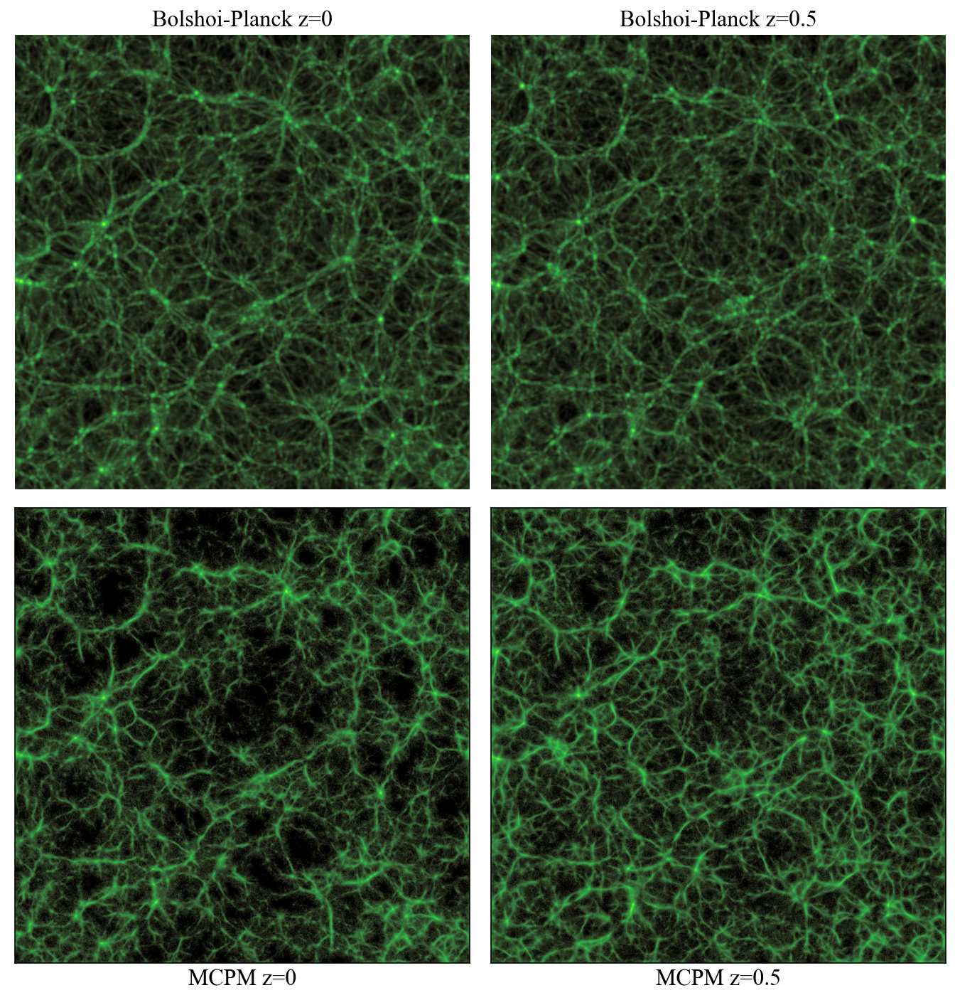

In [8]:
bp_logrhom_z0 = bprho_z0
bp_logrhom_zp5 = bprho_z5
bpslime_z0 = slimedata - 1.5
bpslime_zp5 = slimedata_zp5 - 1.5

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(12,12))

plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 16
cmap = cmasher.nuclear
axes[0,0].imshow(np.sum(bp_logrhom_z0[0:5,:,:], axis=0), cmap=cmap)
axes[0,0].axis('off')
axes[0,0].set_title('Bolshoi-Planck z=0', font='Times New Roman', fontsize=16)
axes[0,1].imshow(np.sum(bp_logrhom_zp5[0:5,:,:], axis=0), cmap=cmap)
axes[0,1].axis('off')
axes[0,1].set_title('Bolshoi-Planck z=0.5', font='Times New Roman', fontsize=16);

# z = np.sum(bpslime_z0, axis=0)
# z = interpolate.relu_p3(z, 0.85, -0.85, pfit)
axes[1,0].imshow(np.sum(bpslime_z0, axis=0), cmap=cmap)
# axes[1,0].axis('off')
axes[1,0].set_xticks([])
axes[1,0].set_yticks([])
axes[1,0].set_xlabel('MCPM z=0', font='Times New Roman', fontsize=16)
axes[1,1].imshow(np.sum(bpslime_zp5, axis=0), cmap=cmap)
# axes[1,1].axis('off')
axes[1,1].set_xticks([])
axes[1,1].set_yticks([])
axes[1,1].set_xlabel('MCPM z=0.5', font='Times New Roman', fontsize=16);

plt.subplots_adjust(hspace=0.04, wspace=0.)
plt.savefig('../figures/bp_slime_vizual_comparison.pdf')


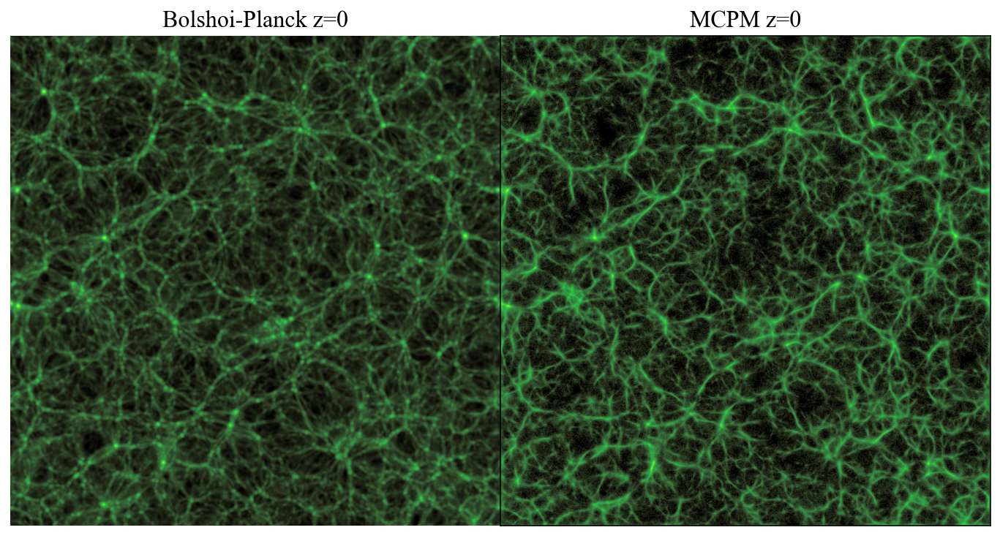

In [9]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(12,12))

plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 16
cmap = cmasher.nuclear
axes[0].imshow(np.sum(bp_logrhom_zp5[0:5,:,:], axis=0), cmap=cmap)
axes[0].axis('off')
axes[0].set_title('Bolshoi-Planck z=0', font='Times New Roman', fontsize=16)

axes[1].imshow(np.sum(bpslime_zp5, axis=0), cmap=cmap)
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[1].set_title('MCPM z=0', font='Times New Roman', fontsize=16)

plt.subplots_adjust(hspace=0.04, wspace=0.)
plt.savefig('/Users/mwilde/Desktop/bpslime_comparison.pdf', dpi=300)

(-8.5, 6.774043560028076)

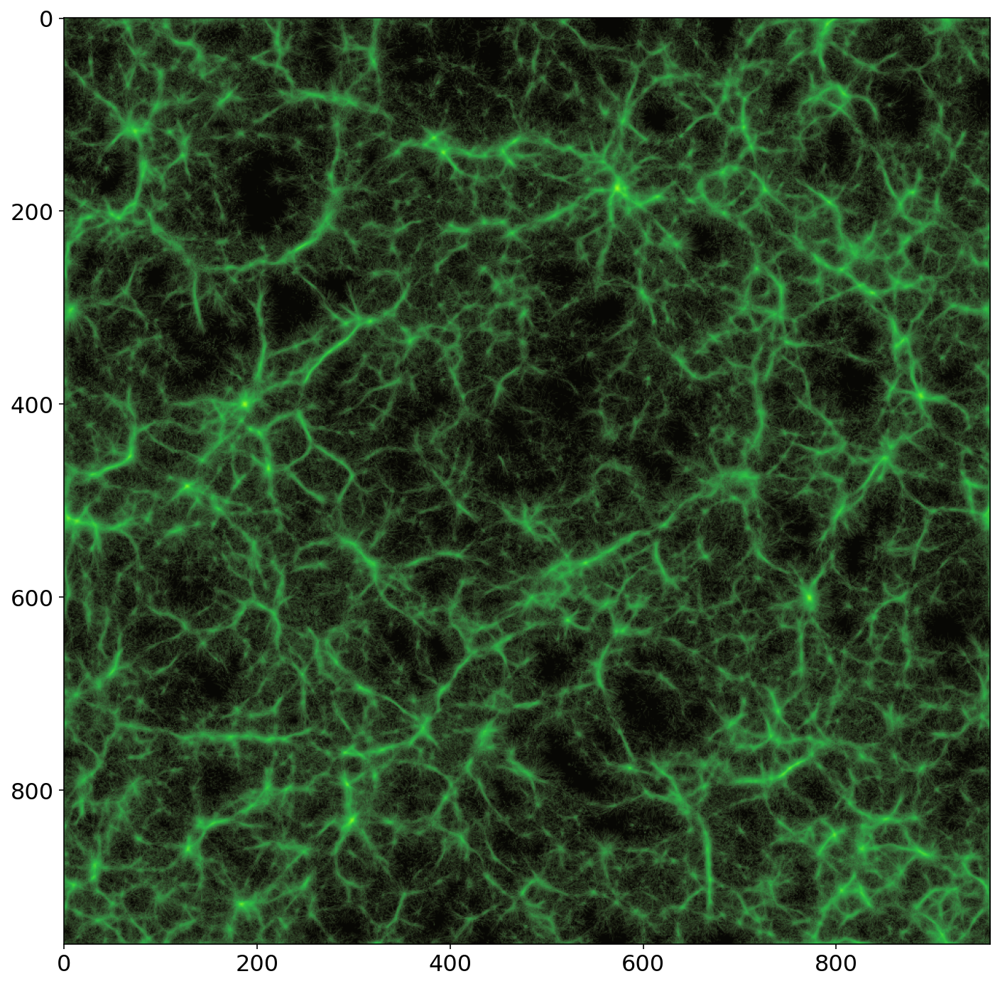

In [10]:
plt.figure(figsize=(12,12))
import matplotlib.colors as colors
z = np.sum(bpslime_z0, axis=0)
# z = interpolate.relu_p3(z, 0.85, -0.85, pfit)
p = plt.imshow(z, cmap=cmap, vmin=z.min()-1, vmax=z.max()*1)
p.get_clim()

(-8.550618887743658, 13.25973553625008)

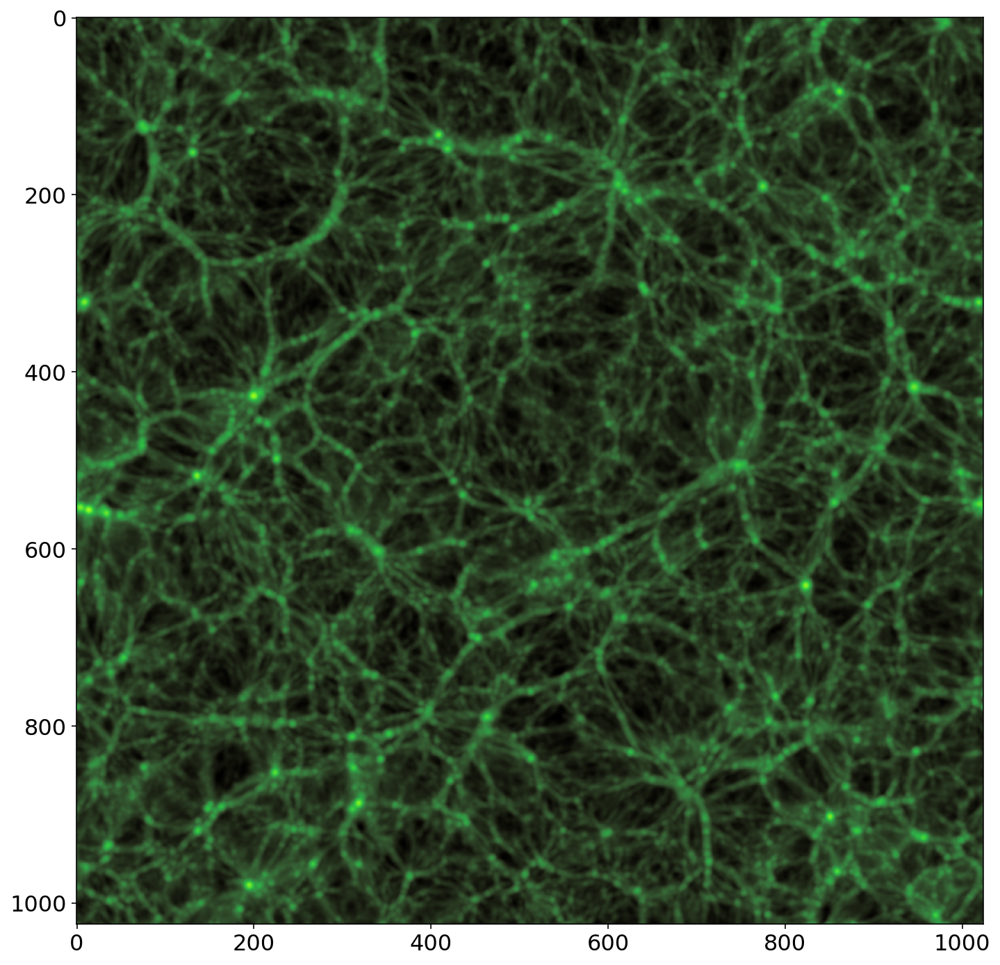

In [11]:
plt.figure(figsize=(12,12))
z2 = np.sum(bp_logrhom_z0[0:5,:,:], axis=0)
p2 = plt.imshow(z2, cmap=cmap)
p2.get_clim()

In [12]:
p.get_clim()

(-8.5, 6.774043560028076)

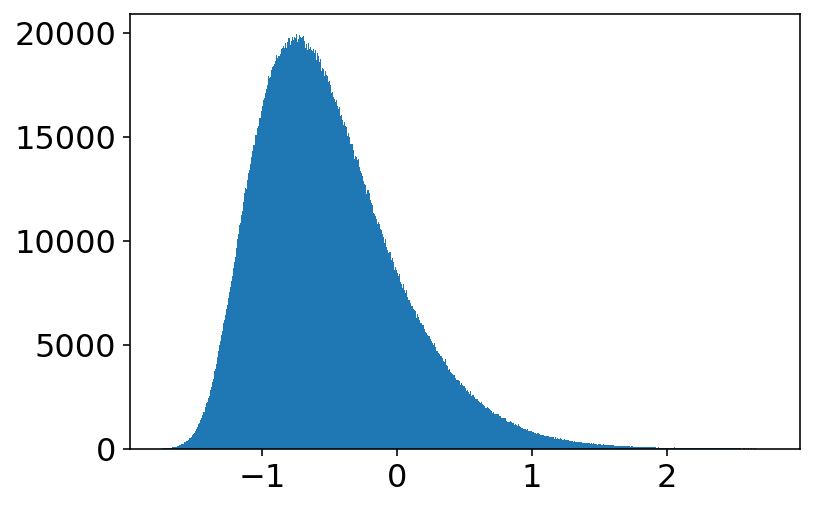

In [13]:
plt.hist(np.ravel(bp_logrhom_z0[0:5,:,:]), bins=1000);

In [14]:
slimeobj = slime.Slime.from_dir(bpslimedir)
slimedata = np.log10(slimeobj.data[0:5, :, :] + 1)

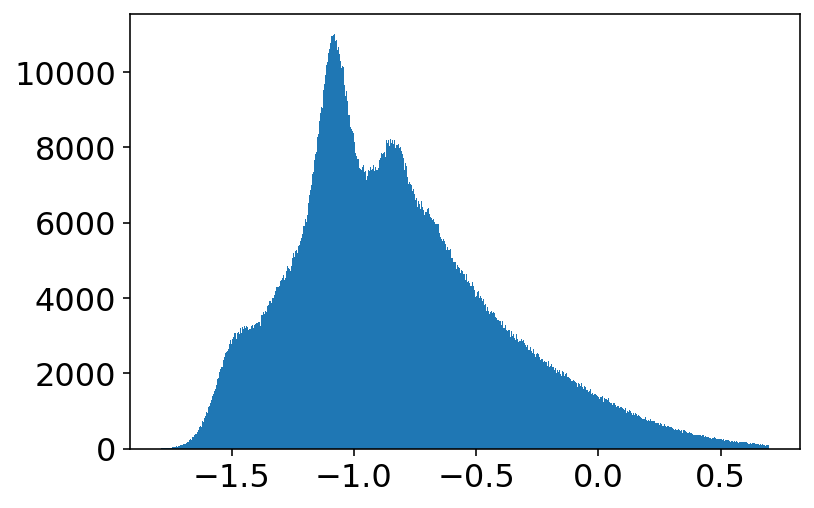

In [15]:
shift = 1.8
bins = np.linspace(0.01-shift, 2.5-shift, 1000)
plt.hist(slimedata.flatten()-shift, bins=bins);

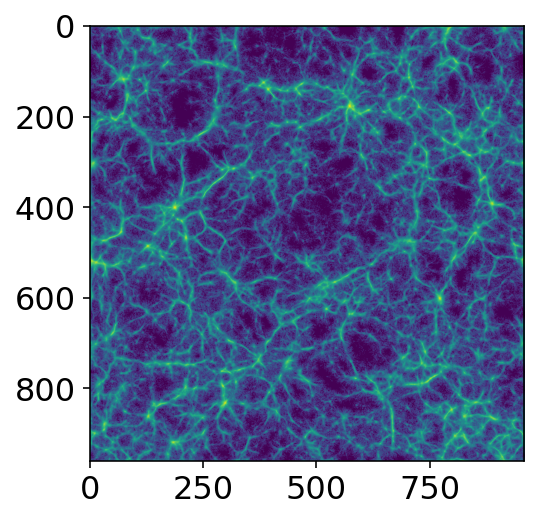

In [16]:
ret = plt.imshow(np.sum(bpslime_z0, axis=0))
ret